In [1]:
!pip install tensorflow

In [2]:
!pip install keras

In [3]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np


In [4]:
#transformation on the training set to avoid overfitting (image augmentation)
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)
training_set = train_datagen.flow_from_directory("C:/Users/anjal/genuinize/dataset/Train",
                                                 target_size = (64, 64),
                                                 batch_size = 32,
                                                 class_mode = 'binary')


Found 140002 images belonging to 2 classes.


In [5]:
test_datagen = ImageDataGenerator(rescale = 1./255)
test_set = test_datagen.flow_from_directory("C:/Users/anjal/genuinize/dataset/Test",
                                            target_size = (64, 64),
                                            batch_size = 32,
                                            class_mode = 'binary')

Found 10905 images belonging to 2 classes.


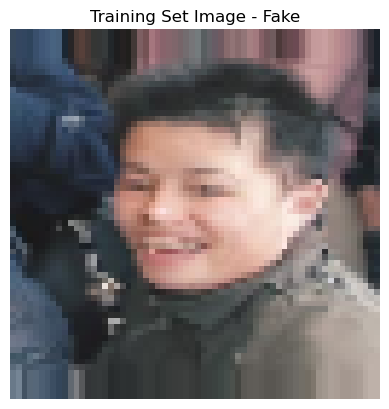

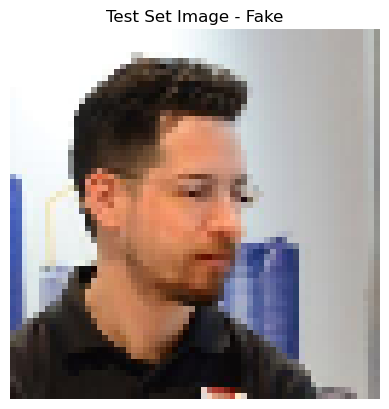

In [6]:
# Function to display a random image from a data generator
def display_random_image(data_generator, title="Random Image"):
    # Get a random batch of images and labels
    batch = next(data_generator)
    images, labels = batch

    # Select a random index from the batch
    random_index = np.random.randint(len(images))

    # Get the corresponding image and label
    image = images[random_index]
    label = labels[random_index]

    # Display the image
    plt.imshow(image)
    plt.title(f"{title} - {'Real' if label == 1 else 'Fake'}")
    plt.axis('off')
    plt.show()

# Display a random image from the training set
display_random_image(training_set, title="Training Set Image")

# Display a random image from the test set
display_random_image(test_set, title="Test Set Image")


In [7]:
cnn = tf.keras.models.Sequential()

In [8]:
cnn.add(tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu', input_shape=[64, 64, 3]))

C:\Users\anjal\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [9]:
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2))

In [10]:
cnn.add(tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2))

In [11]:
cnn.add(tf.keras.layers.Flatten())

In [12]:
cnn.add(tf.keras.layers.Dense(units=128, activation='relu'))

In [13]:
cnn.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

In [14]:
cnn.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [15]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',    # Monitor the validation loss
    patience=3,            # Stop after 3 epochs with no improvement
    restore_best_weights=True  # Restore the best weights when stopping
)

# Update ModelCheckpoint to save with a .keras extension
model_checkpoint = ModelCheckpoint(
    filepath='best_model.keras',  # Updated filepath with .keras extension
    monitor='val_loss',           # Save the model with the best validation loss
    save_best_only=True,          # Only save the best model
    verbose=1
)

# Add these callbacks to your model's fit function
history = cnn.fit(
    training_set,
    validation_data=test_set,
    epochs=10,  # or the desired number of epochs
    callbacks=[early_stopping, model_checkpoint]
)


Epoch 1/10


C:\Users\anjal\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4376/4376 ━━━━━━━━━━━━━━━━━━━━ 0s 503ms/step - accuracy: 0.7290 - loss: 0.5231
Epoch 1: val_loss improved from inf to 0.44529, saving model to best_model.keras
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 2336s 532ms/step - accuracy: 0.7290 - loss: 0.5230 - val_accuracy: 0.7879 - val_loss: 0.4453
Epoch 2/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - accuracy: 0.8465 - loss: 0.3438
Epoch 2: val_loss improved from 0.44529 to 0.39462, saving model to best_model.keras
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 607s 139ms/step - accuracy: 0.8465 - loss: 0.3438 - val_accuracy: 0.8209 - val_loss: 0.3946
Epoch 3/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.8738 - loss: 0.2893
Epoch 3: val_loss did not improve from 0.39462
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 640s 146ms/step - accuracy: 0.8738 - loss: 0.2893 - val_accuracy: 0.8228 - val_loss: 0.4034
Epoch 4/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.8902 - loss: 0.2567
Epoch 4: val_loss improved from 0.39462 to 0.34757, saving model to 

In [181]:
scores = cnn.evaluate(test_set)

341/341 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - accuracy: 0.8607 - loss: 0.6400


In [183]:
scores

[0.644562840461731, 0.8589637875556946]

In [222]:
acc1 = history.history['accuracy']
val_acc1 = history.history['val_accuracy']

loss1 = history.history['loss']
val_loss1 = history.history['val_loss']

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


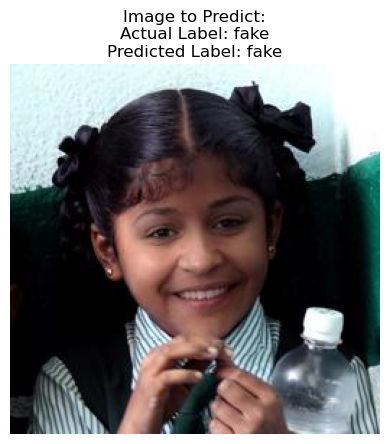

In [151]:
def predict_and_display_random_image(data_dir, display_size=(256, 256)):
    # Get all subdirectories (Real and Fake)
    classes = os.listdir(data_dir)
    chosen_class = random.choice(classes)
    
    # Get a random image from the chosen class
    class_dir = os.path.join(data_dir, chosen_class)
    image_name = random.choice(os.listdir(class_dir))
    image_path = os.path.join(class_dir, image_name)
    
    # Load the image at a higher resolution for display
    test_image = image.load_img(image_path, target_size=display_size)
    test_image_array = image.img_to_array(test_image)
    
    # Resize to match model input size for prediction
    test_image_resized = image.load_img(image_path, target_size=(64, 64))
    test_image_resized_array = image.img_to_array(test_image_resized)
    test_image_resized_array = np.expand_dims(test_image_resized_array, axis=0)
    test_image_resized_array /= 255.0  # Rescale to match training images

    # Predict using the trained model
    result = cnn.predict(test_image_resized_array)
    predicted_label = 'real' if result[0][0] > 0.5 else 'fake'

    # Display the image and prediction
    plt.imshow(test_image)
    plt.title(f"Image to Predict:\nActual Label: {chosen_class.lower()}\nPredicted Label: {predicted_label}")
    plt.axis('off')
    plt.show()

# Example usage
validation_data_dir = "C:/Users/anjal/genuinize/dataset/Validation"
predict_and_display_random_image(validation_data_dir)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


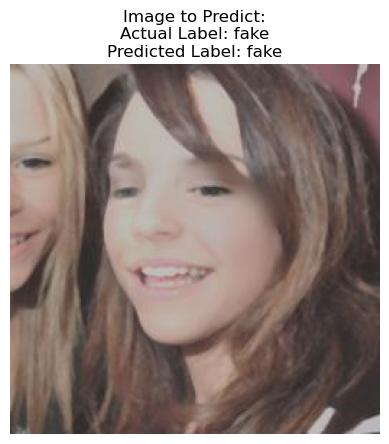

In [153]:
def predict_and_display_random_image(data_dir, display_size=(256, 256)):
    # Get all subdirectories (Real and Fake)
    classes = os.listdir(data_dir)
    chosen_class = random.choice(classes)
    
    # Get a random image from the chosen class
    class_dir = os.path.join(data_dir, chosen_class)
    image_name = random.choice(os.listdir(class_dir))
    image_path = os.path.join(class_dir, image_name)
    
    # Load the image at a higher resolution for display
    test_image = image.load_img(image_path, target_size=display_size)
    test_image_array = image.img_to_array(test_image)
    
    # Resize to match model input size for prediction
    test_image_resized = image.load_img(image_path, target_size=(64, 64))
    test_image_resized_array = image.img_to_array(test_image_resized)
    test_image_resized_array = np.expand_dims(test_image_resized_array, axis=0)
    test_image_resized_array /= 255.0  # Rescale to match training images

    # Predict using the trained model
    result = cnn.predict(test_image_resized_array)
    predicted_label = 'real' if result[0][0] > 0.5 else 'fake'

    # Display the image and prediction
    plt.imshow(test_image)
    plt.title(f"Image to Predict:\nActual Label: {chosen_class.lower()}\nPredicted Label: {predicted_label}")
    plt.axis('off')
    plt.show()

# Example usage
validation_data_dir = "C:/Users/anjal/genuinize/dataset/Validation"
predict_and_display_random_image(validation_data_dir)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


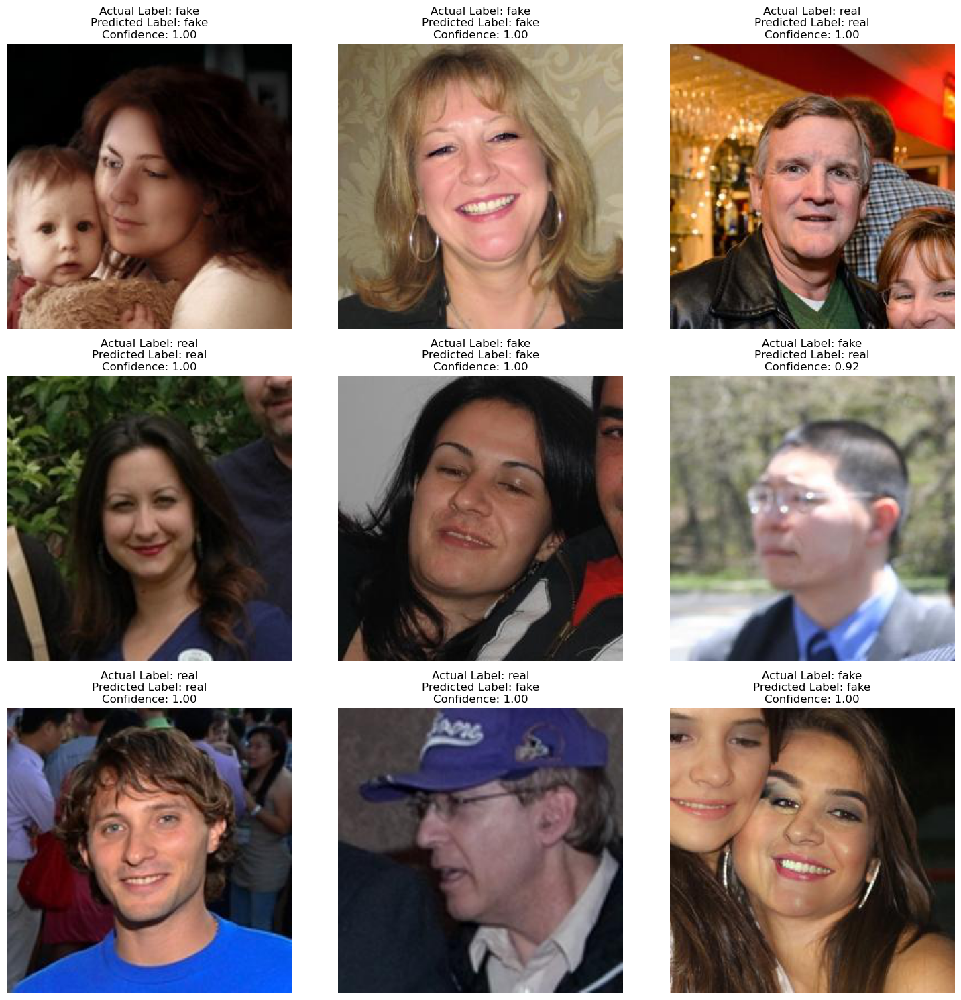

In [143]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing import image

def predict_and_display_random_images(data_dir, num_images=9, display_size=(256, 256)):
    plt.figure(figsize=(15, 15))
    
    classes = os.listdir(data_dir)
    
    for i in range(num_images):
        # Randomly choose a class and an image within that class
        chosen_class = random.choice(classes)
        class_dir = os.path.join(data_dir, chosen_class)
        image_name = random.choice(os.listdir(class_dir))
        image_path = os.path.join(class_dir, image_name)
        
        # Load the image at a higher resolution for display
        test_image = image.load_img(image_path, target_size=display_size)
        test_image_array = image.img_to_array(test_image)
        
        # Resize to match model input size for prediction
        test_image_resized = image.load_img(image_path, target_size=(64, 64))
        test_image_resized_array = image.img_to_array(test_image_resized)
        test_image_resized_array = np.expand_dims(test_image_resized_array, axis=0)
        test_image_resized_array /= 255.0  # Rescale to match training images

        # Predict using the trained model
        result = cnn.predict(test_image_resized_array)
        predicted_label = 'real' if result[0][0] > 0.5 else 'fake'
        confidence = result[0][0] if predicted_label == 'real' else 1 - result[0][0]
        
        # Display the image, actual label, predicted label, and confidence
        plt.subplot(3, 3, i + 1)
        plt.imshow(test_image)
        plt.title(f"Actual Label: {chosen_class.lower()}\n"
                  f"Predicted Label: {predicted_label}\n"
                  f"Confidence: {confidence:.2f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


validation_data_dir = "C:/Users/anjal/genuinize/dataset/Validation"
predict_and_display_random_images(validation_data_dir)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


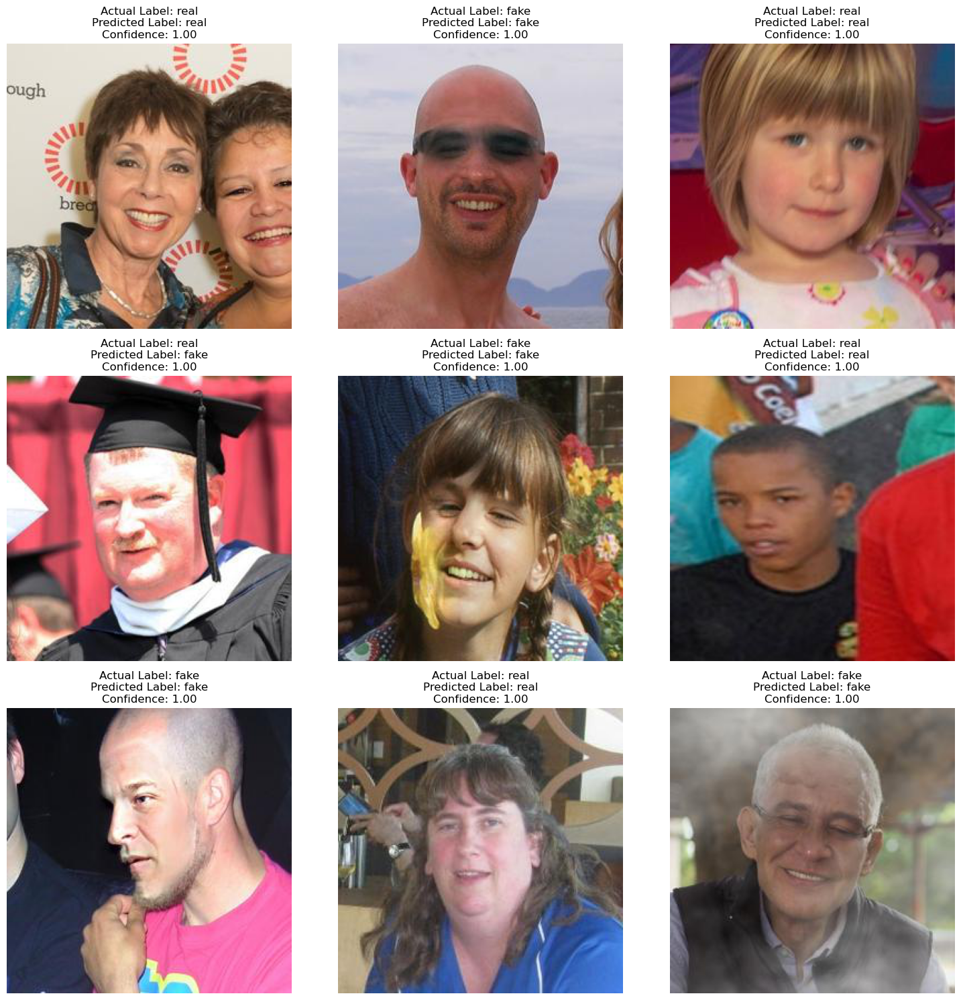

In [145]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing import image

def predict_and_display_random_images(data_dir, num_images=9, display_size=(256, 256)):
    plt.figure(figsize=(15, 15))
    
    classes = os.listdir(data_dir)
    
    for i in range(num_images):
        # Randomly choose a class and an image within that class
        chosen_class = random.choice(classes)
        class_dir = os.path.join(data_dir, chosen_class)
        image_name = random.choice(os.listdir(class_dir))
        image_path = os.path.join(class_dir, image_name)
        
        # Load the image at a higher resolution for display
        test_image = image.load_img(image_path, target_size=display_size)
        test_image_array = image.img_to_array(test_image)
        
        # Resize to match model input size for prediction
        test_image_resized = image.load_img(image_path, target_size=(64, 64))
        test_image_resized_array = image.img_to_array(test_image_resized)
        test_image_resized_array = np.expand_dims(test_image_resized_array, axis=0)
        test_image_resized_array /= 255.0  # Rescale to match training images

        # Predict using the trained model
        result = cnn.predict(test_image_resized_array)
        predicted_label = 'real' if result[0][0] > 0.5 else 'fake'
        confidence = result[0][0] if predicted_label == 'real' else 1 - result[0][0]
        
        # Display the image, actual label, predicted label, and confidence
        plt.subplot(3, 3, i + 1)
        plt.imshow(test_image)
        plt.title(f"Actual Label: {chosen_class.lower()}\n"
                  f"Predicted Label: {predicted_label}\n"
                  f"Confidence: {confidence:.2f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


validation_data_dir = "C:/Users/anjal/genuinize/dataset/Validation"
predict_and_display_random_images(validation_data_dir)


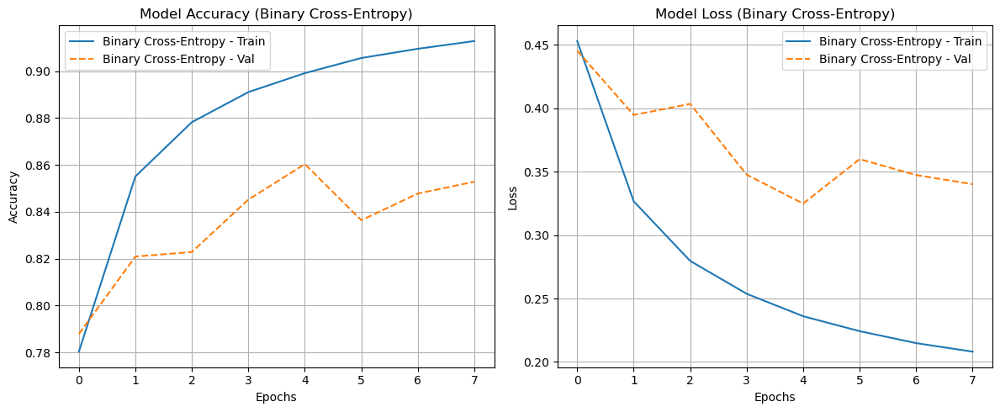

In [52]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss curves for Binary Cross-Entropy Loss
def plot_accuracy_and_loss_bce(history):
    # Plot Accuracy
    plt.figure(figsize=(12, 5))
    
    # Plot training and validation accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Binary Cross-Entropy - Train')
    plt.plot(history.history['val_accuracy'], '--', label='Binary Cross-Entropy - Val')

    plt.title('Model Accuracy (Binary Cross-Entropy)')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Plot Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Binary Cross-Entropy - Train')
    plt.plot(history.history['val_loss'], '--', label='Binary Cross-Entropy - Val')

    plt.title('Model Loss (Binary Cross-Entropy)')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Plot the accuracy and loss curves for Binary Cross-Entropy Loss
plot_accuracy_and_loss_bce(history)


In [86]:
cnn.export("C:/Users/anjal/genuinize/saved_models/binary_cross_entropy")

INFO:tensorflow:Assets written to: C:/Users/anjal/genuinize/saved_models/binary_cross_entropy\assets


INFO:tensorflow:Assets written to: C:/Users/anjal/genuinize/saved_models/binary_cross_entropy\assets


Saved artifact at 'C:/Users/anjal/genuinize/saved_models/binary_cross_entropy'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)
Captures:
  2390184389200: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390184391504: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390405117712: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390405117520: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390454667024: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390454665680: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390454666832: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390454665296: TensorSpec(shape=(), dtype=tf.resource, name=None)


In [54]:
from tensorflow.keras import backend as K

# Define the focal loss function
def focal_loss(gamma=2.0, alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.cast(y_pred, tf.float32)

        # Calculate binary cross-entropy
        bce = K.binary_crossentropy(y_true, y_pred)

        # Calculate focal loss components
        y_pred = K.clip(y_pred, K.epsilon(), 1 - K.epsilon())
        pt = tf.where(K.equal(y_true, 1), y_pred, 1 - y_pred)
        fl = alpha * K.pow(1 - pt, gamma) * bce

        return K.mean(fl)
    return focal_loss_fixed

# Compile the model with focal loss
cnn.compile(optimizer='adam', loss=focal_loss(gamma=2.0, alpha=0.25), metrics=['accuracy'])


In [56]:
history2 = cnn.fit(x = training_set, validation_data = test_set, epochs = 10)

Epoch 1/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 801s 182ms/step - accuracy: 0.8987 - loss: 0.0163 - val_accuracy: 0.8370 - val_loss: 0.0230
Epoch 2/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 795s 181ms/step - accuracy: 0.9042 - loss: 0.0150 - val_accuracy: 0.8557 - val_loss: 0.0246
Epoch 3/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 798s 182ms/step - accuracy: 0.9106 - loss: 0.0142 - val_accuracy: 0.8560 - val_loss: 0.0226
Epoch 4/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 796s 182ms/step - accuracy: 0.9142 - loss: 0.0137 - val_accuracy: 0.8517 - val_loss: 0.0229
Epoch 5/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 792s 181ms/step - accuracy: 0.9179 - loss: 0.0131 - val_accuracy: 0.8567 - val_loss: 0.0232
Epoch 6/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 796s 182ms/step - accuracy: 0.9202 - loss: 0.0127 - val_accuracy: 0.8379 - val_loss: 0.0275
Epoch 7/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 795s 181ms/step - accuracy: 0.9195 - loss: 0.0126 - val_accuracy: 0.8485 - val_loss: 0.0246
Epoch 8/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 792s 181ms/step - ac

In [185]:
scores = cnn.evaluate(test_set)

341/341 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8580 - loss: 0.6512


In [187]:
scores

[0.644562840461731, 0.8589637875556946]

In [224]:
acc2 = history2.history['accuracy']
val_acc2 = history2.history['val_accuracy']

loss2 = history2.history['loss']
val_loss2 = history2.history['val_loss']

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


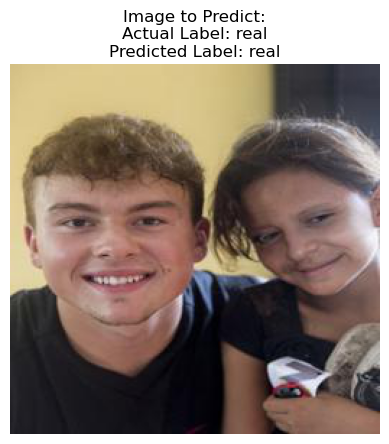

In [157]:
def predict_and_display_random_image(data_dir, display_size=(256, 256)):
    # Get all subdirectories (Real and Fake)
    classes = os.listdir(data_dir)
    chosen_class = random.choice(classes)
    
    # Get a random image from the chosen class
    class_dir = os.path.join(data_dir, chosen_class)
    image_name = random.choice(os.listdir(class_dir))
    image_path = os.path.join(class_dir, image_name)
    
    # Load the image at a higher resolution for display
    test_image = image.load_img(image_path, target_size=display_size)
    test_image_array = image.img_to_array(test_image)
    
    # Resize to match model input size for prediction
    test_image_resized = image.load_img(image_path, target_size=(64, 64))
    test_image_resized_array = image.img_to_array(test_image_resized)
    test_image_resized_array = np.expand_dims(test_image_resized_array, axis=0)
    test_image_resized_array /= 255.0  # Rescale to match training images

    # Predict using the trained model
    result = cnn.predict(test_image_resized_array)
    predicted_label = 'real' if result[0][0] > 0.5 else 'fake'

    # Display the image and prediction
    plt.imshow(test_image)
    plt.title(f"Image to Predict:\nActual Label: {chosen_class.lower()}\nPredicted Label: {predicted_label}")
    plt.axis('off')
    plt.show()

# Example usage
validation_data_dir = "C:/Users/anjal/genuinize/dataset/Validation"
predict_and_display_random_image(validation_data_dir)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


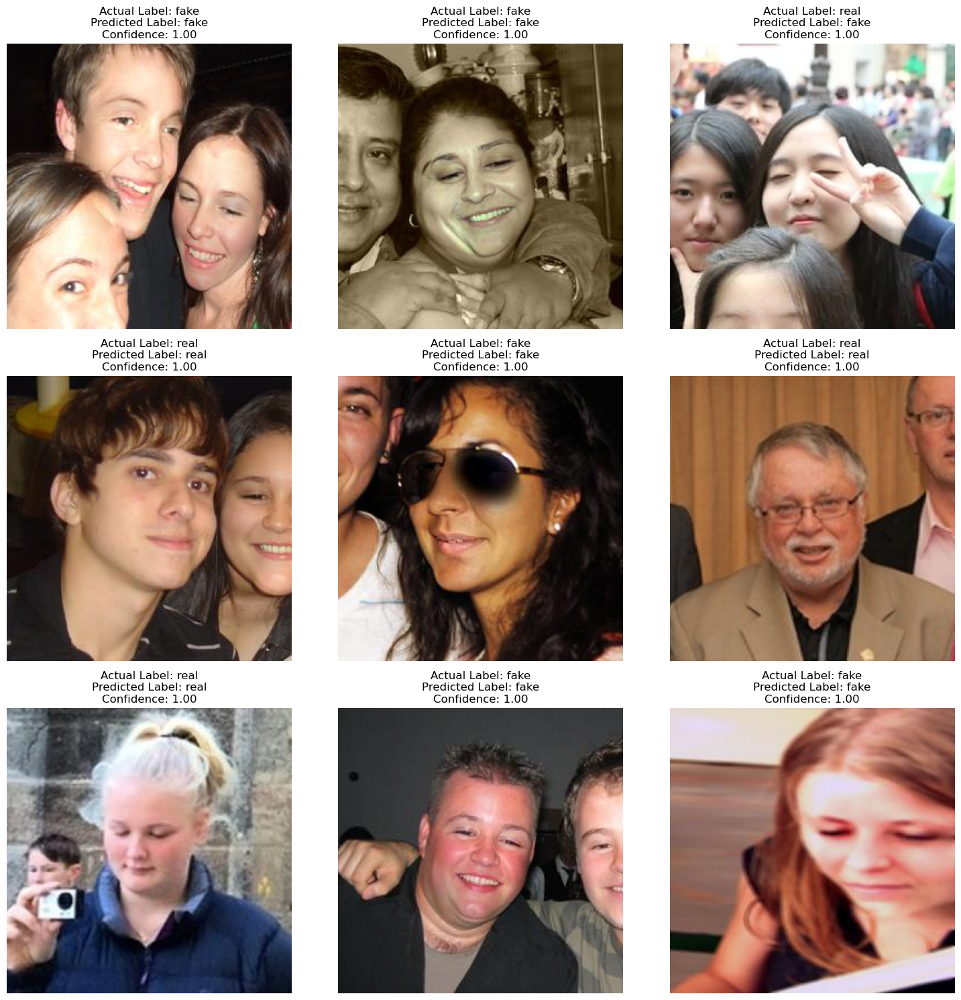

In [139]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing import image

def predict_and_display_random_images(data_dir, num_images=9, display_size=(256, 256)):
    plt.figure(figsize=(15, 15))
    
    classes = os.listdir(data_dir)
    
    for i in range(num_images):
        # Randomly choose a class and an image within that class
        chosen_class = random.choice(classes)
        class_dir = os.path.join(data_dir, chosen_class)
        image_name = random.choice(os.listdir(class_dir))
        image_path = os.path.join(class_dir, image_name)
        
        # Load the image at a higher resolution for display
        test_image = image.load_img(image_path, target_size=display_size)
        test_image_array = image.img_to_array(test_image)
        
        # Resize to match model input size for prediction
        test_image_resized = image.load_img(image_path, target_size=(64, 64))
        test_image_resized_array = image.img_to_array(test_image_resized)
        test_image_resized_array = np.expand_dims(test_image_resized_array, axis=0)
        test_image_resized_array /= 255.0  # Rescale to match training images

        # Predict using the trained model
        result = cnn.predict(test_image_resized_array)
        predicted_label = 'real' if result[0][0] > 0.5 else 'fake'
        confidence = result[0][0] if predicted_label == 'real' else 1 - result[0][0]
        
        # Display the image, actual label, predicted label, and confidence
        plt.subplot(3, 3, i + 1)
        plt.imshow(test_image)
        plt.title(f"Actual Label: {chosen_class.lower()}\n"
                  f"Predicted Label: {predicted_label}\n"
                  f"Confidence: {confidence:.2f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


validation_data_dir = "C:/Users/anjal/genuinize/dataset/Validation"
predict_and_display_random_images(validation_data_dir)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


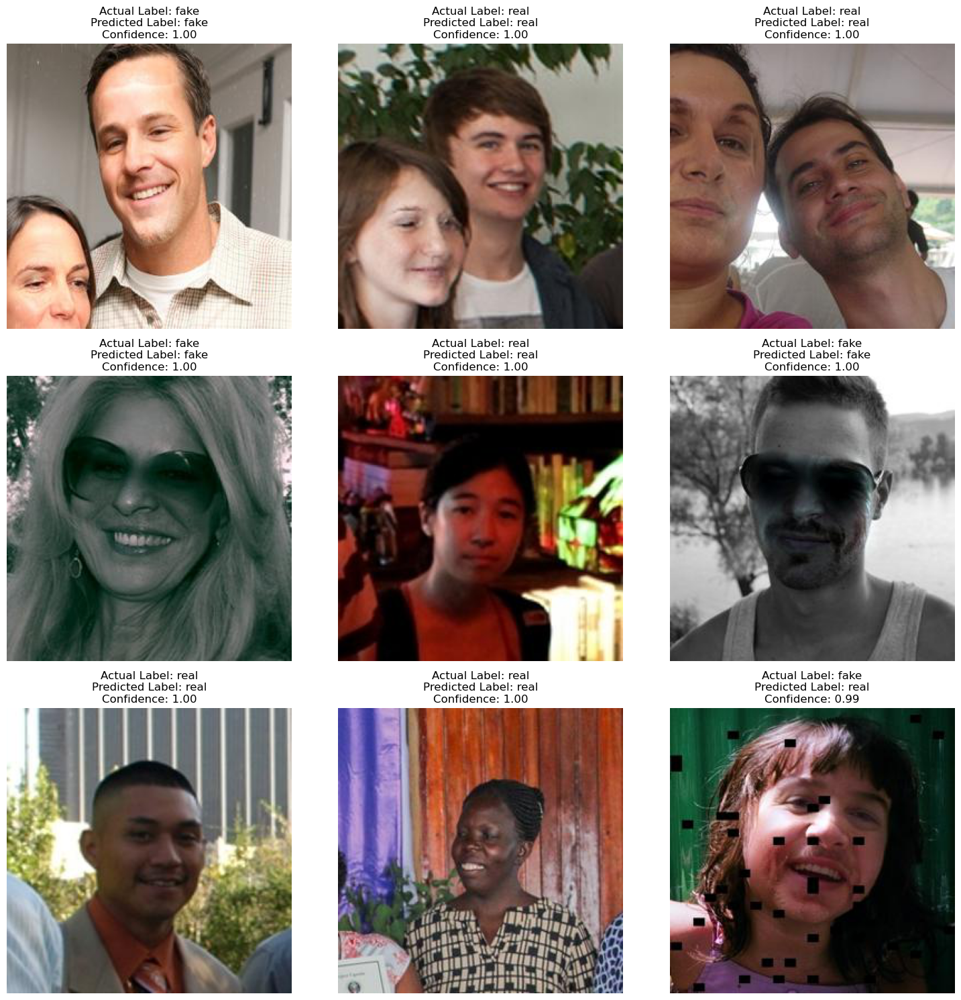

In [141]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing import image

def predict_and_display_random_images(data_dir, num_images=9, display_size=(256, 256)):
    plt.figure(figsize=(15, 15))
    
    classes = os.listdir(data_dir)
    
    for i in range(num_images):
        # Randomly choose a class and an image within that class
        chosen_class = random.choice(classes)
        class_dir = os.path.join(data_dir, chosen_class)
        image_name = random.choice(os.listdir(class_dir))
        image_path = os.path.join(class_dir, image_name)
        
        # Load the image at a higher resolution for display
        test_image = image.load_img(image_path, target_size=display_size)
        test_image_array = image.img_to_array(test_image)
        
        # Resize to match model input size for prediction
        test_image_resized = image.load_img(image_path, target_size=(64, 64))
        test_image_resized_array = image.img_to_array(test_image_resized)
        test_image_resized_array = np.expand_dims(test_image_resized_array, axis=0)
        test_image_resized_array /= 255.0  # Rescale to match training images

        # Predict using the trained model
        result = cnn.predict(test_image_resized_array)
        predicted_label = 'real' if result[0][0] > 0.5 else 'fake'
        confidence = result[0][0] if predicted_label == 'real' else 1 - result[0][0]
        
        # Display the image, actual label, predicted label, and confidence
        plt.subplot(3, 3, i + 1)
        plt.imshow(test_image)
        plt.title(f"Actual Label: {chosen_class.lower()}\n"
                  f"Predicted Label: {predicted_label}\n"
                  f"Confidence: {confidence:.2f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


validation_data_dir = "C:/Users/anjal/genuinize/dataset/Validation"
predict_and_display_random_images(validation_data_dir)


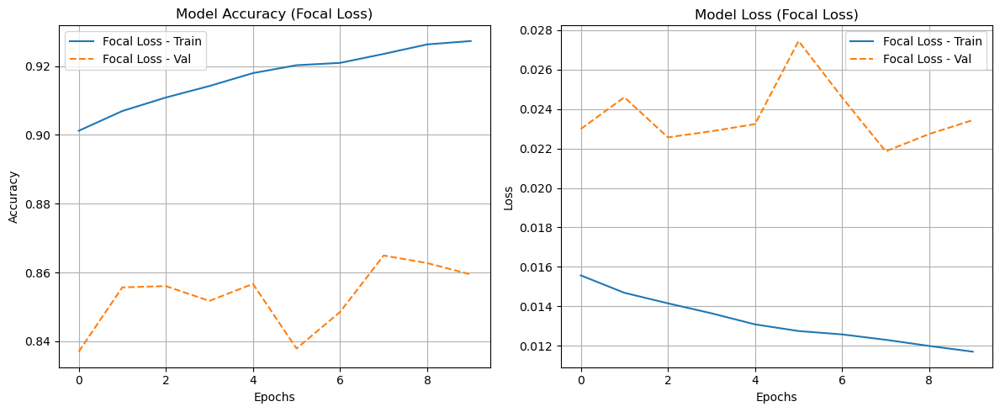

In [70]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss curves for Focal Loss
def plot_accuracy_and_loss_focal(history2):
    # Plot Accuracy
    plt.figure(figsize=(12, 5))
    
    # Plot training and validation accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history2.history['accuracy'], label='Focal Loss - Train')
    plt.plot(history2.history['val_accuracy'], '--', label='Focal Loss - Val')

    plt.title('Model Accuracy (Focal Loss)')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Plot Loss
    plt.subplot(1, 2, 2)
    plt.plot(history2.history['loss'], label='Focal Loss - Train')
    plt.plot(history2.history['val_loss'], '--', label='Focal Loss - Val')

    plt.title('Model Loss (Focal Loss)')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Plot the accuracy and loss curves for Focal Loss
plot_accuracy_and_loss_focal(history2)


In [84]:
cnn.export("C:/Users/anjal/genuinize/saved_models/focal_loss")

INFO:tensorflow:Assets written to: C:/Users/anjal/genuinize/saved_models/focal_loss\assets


INFO:tensorflow:Assets written to: C:/Users/anjal/genuinize/saved_models/focal_loss\assets


Saved artifact at 'C:/Users/anjal/genuinize/saved_models/focal_loss'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)
Captures:
  2390184389200: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390184391504: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390405117712: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390405117520: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390454667024: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390454665680: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390454666832: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390454665296: TensorSpec(shape=(), dtype=tf.resource, name=None)


In [88]:
# Compile the model with hinge loss
cnn.compile(optimizer='adam', loss='hinge', metrics=['accuracy'])


In [159]:
history3 = cnn.fit(x = training_set, validation_data = test_set, epochs = 10)

Epoch 1/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 629s 143ms/step - accuracy: 0.9185 - loss: 0.5820 - val_accuracy: 0.8508 - val_loss: 0.6530
Epoch 2/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 497s 113ms/step - accuracy: 0.9206 - loss: 0.5790 - val_accuracy: 0.8656 - val_loss: 0.6388
Epoch 3/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 497s 113ms/step - accuracy: 0.9194 - loss: 0.5813 - val_accuracy: 0.8700 - val_loss: 0.6342
Epoch 4/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 496s 113ms/step - accuracy: 0.9192 - loss: 0.5805 - val_accuracy: 0.8121 - val_loss: 0.6916
Epoch 5/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 505s 115ms/step - accuracy: 0.9170 - loss: 0.5824 - val_accuracy: 0.8697 - val_loss: 0.6340
Epoch 6/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 1692s 387ms/step - accuracy: 0.9152 - loss: 0.5861 - val_accuracy: 0.8568 - val_loss: 0.6465
Epoch 7/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 821s 187ms/step - accuracy: 0.9160 - loss: 0.5841 - val_accuracy: 0.8635 - val_loss: 0.6402
Epoch 8/10
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 807s 184ms/step - a

In [161]:
scores = cnn.evaluate(test_set)

341/341 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - accuracy: 0.8554 - loss: 0.6510


In [163]:
scores

[0.6445626020431519, 0.8589637875556946]

In [226]:
acc3 = history3.history['accuracy']
val_acc3 = history3.history['val_accuracy']

loss3 = history3.history['loss']
val_loss3 = history3.history['val_loss']

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


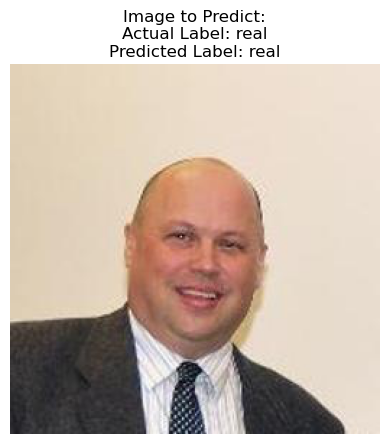

In [167]:
def predict_and_display_random_image(data_dir, display_size=(256, 256)):
    # Get all subdirectories (Real and Fake)
    classes = os.listdir(data_dir)
    chosen_class = random.choice(classes)
    
    # Get a random image from the chosen class
    class_dir = os.path.join(data_dir, chosen_class)
    image_name = random.choice(os.listdir(class_dir))
    image_path = os.path.join(class_dir, image_name)
    
    # Load the image at a higher resolution for display
    test_image = image.load_img(image_path, target_size=display_size)
    test_image_array = image.img_to_array(test_image)
    
    # Resize to match model input size for prediction
    test_image_resized = image.load_img(image_path, target_size=(64, 64))
    test_image_resized_array = image.img_to_array(test_image_resized)
    test_image_resized_array = np.expand_dims(test_image_resized_array, axis=0)
    test_image_resized_array /= 255.0  # Rescale to match training images

    # Predict using the trained model
    result = cnn.predict(test_image_resized_array)
    predicted_label = 'real' if result[0][0] > 0.5 else 'fake'

    # Display the image and prediction
    plt.imshow(test_image)
    plt.title(f"Image to Predict:\nActual Label: {chosen_class.lower()}\nPredicted Label: {predicted_label}")
    plt.axis('off')
    plt.show()

# Example usage
validation_data_dir = "C:/Users/anjal/genuinize/dataset/Validation"
predict_and_display_random_image(validation_data_dir)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


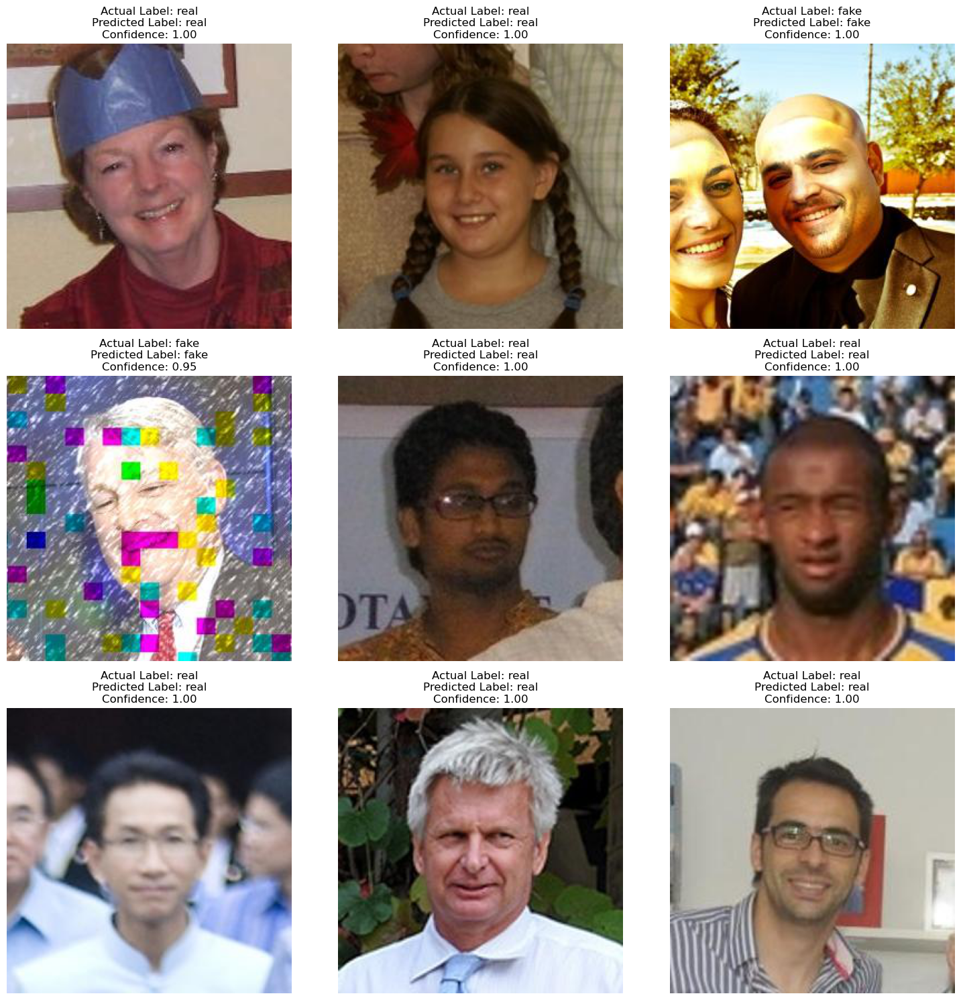

In [173]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing import image

def predict_and_display_random_images(data_dir, num_images=9, display_size=(256, 256)):
    plt.figure(figsize=(15, 15))
    
    classes = os.listdir(data_dir)
    
    for i in range(num_images):
        # Randomly choose a class and an image within that class
        chosen_class = random.choice(classes)
        class_dir = os.path.join(data_dir, chosen_class)
        image_name = random.choice(os.listdir(class_dir))
        image_path = os.path.join(class_dir, image_name)
        
        # Load the image at a higher resolution for display
        test_image = image.load_img(image_path, target_size=display_size)
        test_image_array = image.img_to_array(test_image)
        
        # Resize to match model input size for prediction
        test_image_resized = image.load_img(image_path, target_size=(64, 64))
        test_image_resized_array = image.img_to_array(test_image_resized)
        test_image_resized_array = np.expand_dims(test_image_resized_array, axis=0)
        test_image_resized_array /= 255.0  # Rescale to match training images

        # Predict using the trained model
        result = cnn.predict(test_image_resized_array)
        predicted_label = 'real' if result[0][0] > 0.5 else 'fake'
        confidence = result[0][0] if predicted_label == 'real' else 1 - result[0][0]
        
        # Display the image, actual label, predicted label, and confidence
        plt.subplot(3, 3, i + 1)
        plt.imshow(test_image)
        plt.title(f"Actual Label: {chosen_class.lower()}\n"
                  f"Predicted Label: {predicted_label}\n"
                  f"Confidence: {confidence:.2f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


validation_data_dir = "C:/Users/anjal/genuinize/dataset/Validation"
predict_and_display_random_images(validation_data_dir)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


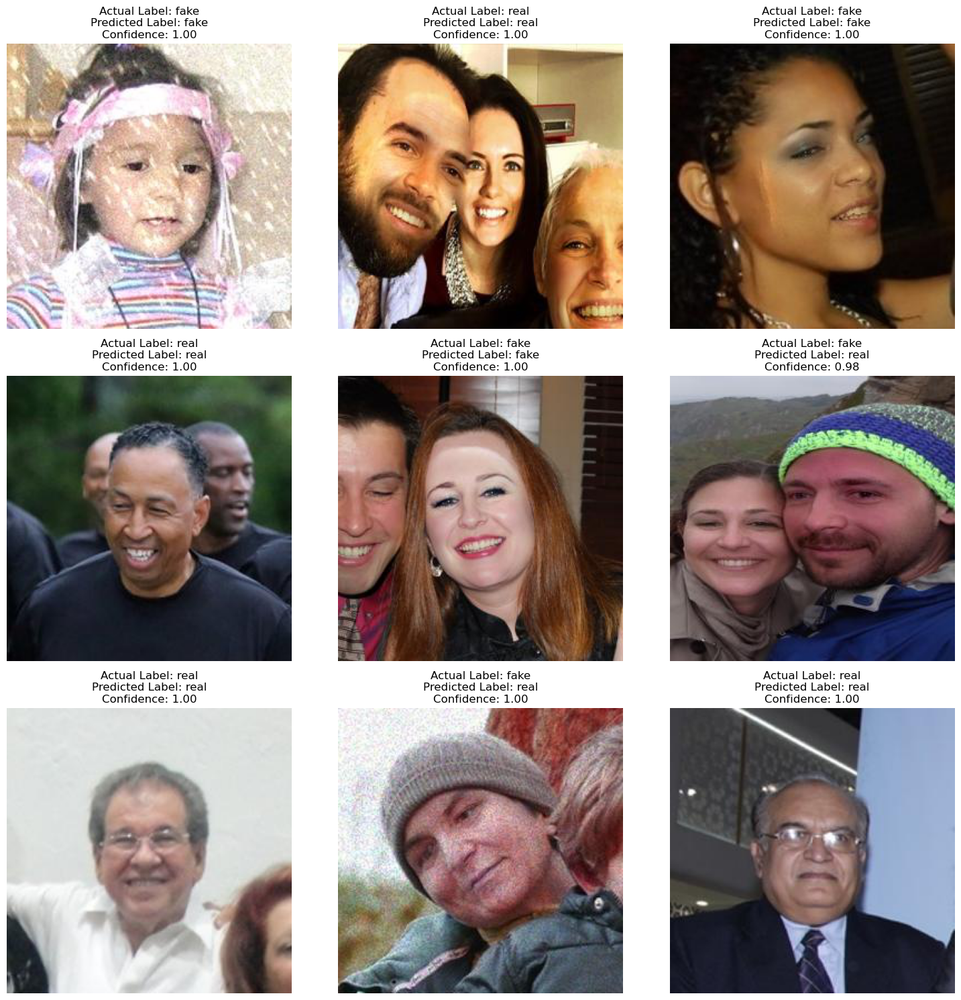

In [175]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing import image

def predict_and_display_random_images(data_dir, num_images=9, display_size=(256, 256)):
    plt.figure(figsize=(15, 15))
    
    classes = os.listdir(data_dir)
    
    for i in range(num_images):
        # Randomly choose a class and an image within that class
        chosen_class = random.choice(classes)
        class_dir = os.path.join(data_dir, chosen_class)
        image_name = random.choice(os.listdir(class_dir))
        image_path = os.path.join(class_dir, image_name)
        
        # Load the image at a higher resolution for display
        test_image = image.load_img(image_path, target_size=display_size)
        test_image_array = image.img_to_array(test_image)
        
        # Resize to match model input size for prediction
        test_image_resized = image.load_img(image_path, target_size=(64, 64))
        test_image_resized_array = image.img_to_array(test_image_resized)
        test_image_resized_array = np.expand_dims(test_image_resized_array, axis=0)
        test_image_resized_array /= 255.0  # Rescale to match training images

        # Predict using the trained model
        result = cnn.predict(test_image_resized_array)
        predicted_label = 'real' if result[0][0] > 0.5 else 'fake'
        confidence = result[0][0] if predicted_label == 'real' else 1 - result[0][0]
        
        # Display the image, actual label, predicted label, and confidence
        plt.subplot(3, 3, i + 1)
        plt.imshow(test_image)
        plt.title(f"Actual Label: {chosen_class.lower()}\n"
                  f"Predicted Label: {predicted_label}\n"
                  f"Confidence: {confidence:.2f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


validation_data_dir = "C:/Users/anjal/genuinize/dataset/Validation"
predict_and_display_random_images(validation_data_dir)


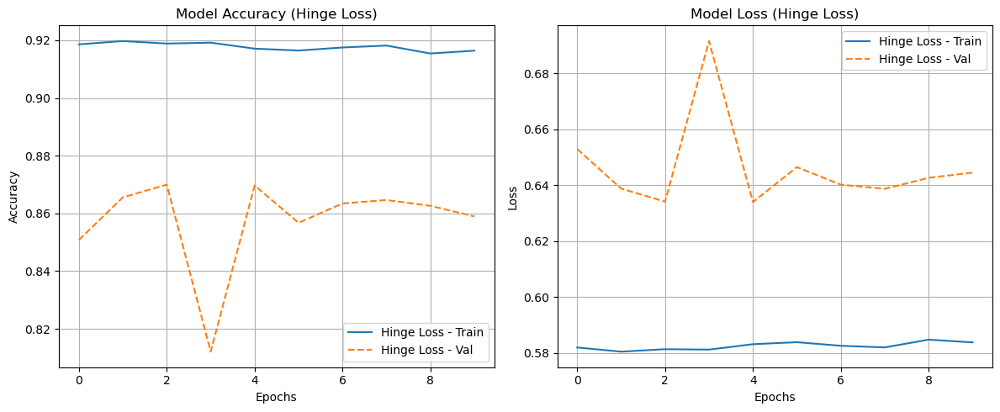

In [177]:
import matplotlib.pyplot as plt

# Function to plot accuracy and loss curves for Focal Loss
def plot_accuracy_and_loss_focal(history3):
    # Plot Accuracy
    plt.figure(figsize=(12, 5))
    
    # Plot training and validation accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history3.history['accuracy'], label='Hinge Loss - Train')
    plt.plot(history3.history['val_accuracy'], '--', label='Hinge Loss - Val')

    plt.title('Model Accuracy (Hinge Loss)')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Plot Loss
    plt.subplot(1, 2, 2)
    plt.plot(history3.history['loss'], label='Hinge Loss - Train')
    plt.plot(history3.history['val_loss'], '--', label='Hinge Loss - Val')

    plt.title('Model Loss (Hinge Loss)')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Plot the accuracy and loss curves for Focal Loss
plot_accuracy_and_loss_focal(history3)


In [179]:
cnn.export("C:/Users/anjal/genuinize/saved_models/hinge_loss")

INFO:tensorflow:Assets written to: C:/Users/anjal/genuinize/saved_models/hinge_loss\assets


INFO:tensorflow:Assets written to: C:/Users/anjal/genuinize/saved_models/hinge_loss\assets


Saved artifact at 'C:/Users/anjal/genuinize/saved_models/hinge_loss'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)
Captures:
  2390184389200: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390184391504: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390405117712: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390405117520: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390454667024: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390454665680: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390454666832: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2390454665296: TensorSpec(shape=(), dtype=tf.resource, name=None)


In [ ]:
#Accuracy and Loss Curves Comparison

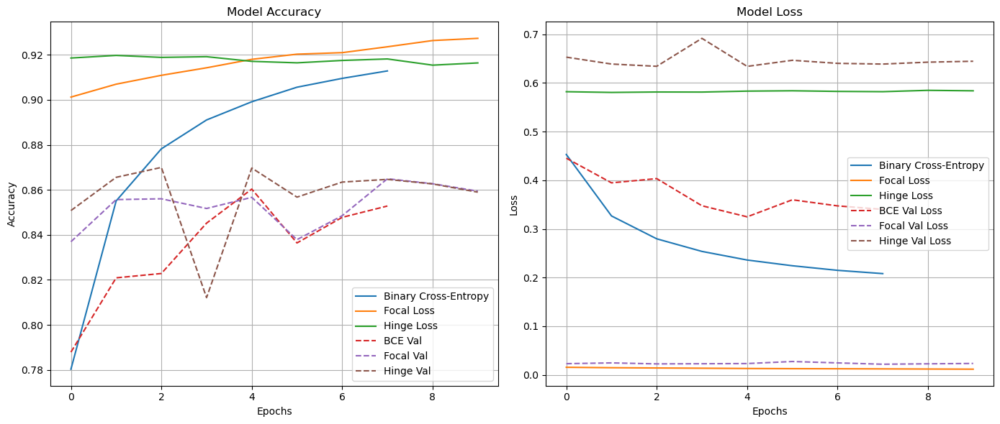

In [189]:
import matplotlib.pyplot as plt

def plot_comparison(history, history2, history3):
    plt.figure(figsize=(14, 6))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Binary Cross-Entropy')
    plt.plot(history2.history['accuracy'], label='Focal Loss')
    plt.plot(history3.history['accuracy'], label='Hinge Loss')
    plt.plot(history.history['val_accuracy'], '--', label='BCE Val')
    plt.plot(history2.history['val_accuracy'], '--', label='Focal Val')
    plt.plot(history3.history['val_accuracy'], '--', label='Hinge Val')
    plt.title('Model Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Binary Cross-Entropy')
    plt.plot(history2.history['loss'], label='Focal Loss')
    plt.plot(history3.history['loss'], label='Hinge Loss')
    plt.plot(history.history['val_loss'], '--', label='BCE Val Loss')
    plt.plot(history2.history['val_loss'], '--', label='Focal Val Loss')
    plt.plot(history3.history['val_loss'], '--', label='Hinge Val Loss')
    plt.title('Model Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Example usage
plot_comparison(history, history2, history3)


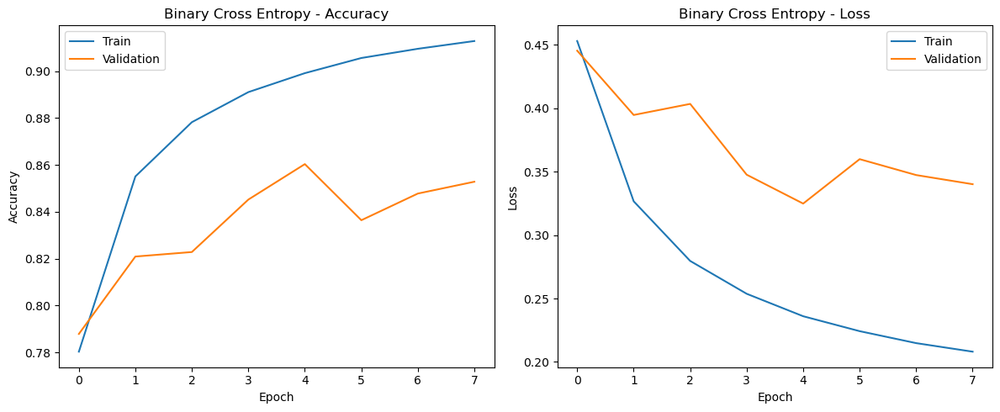

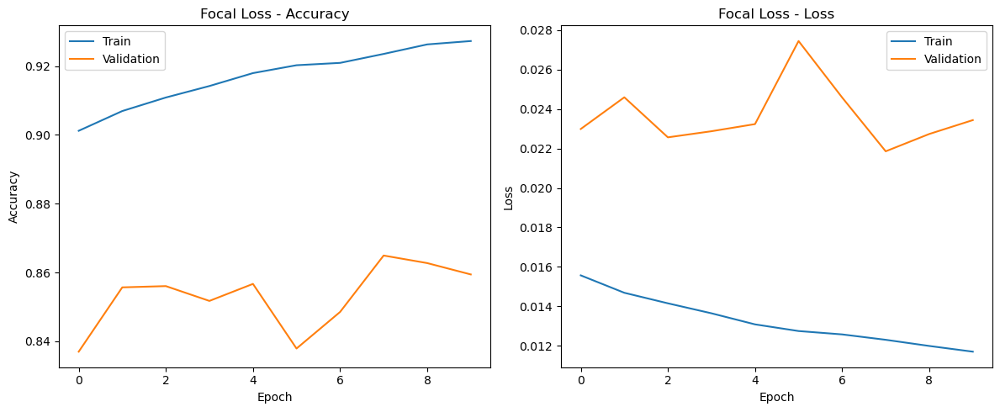

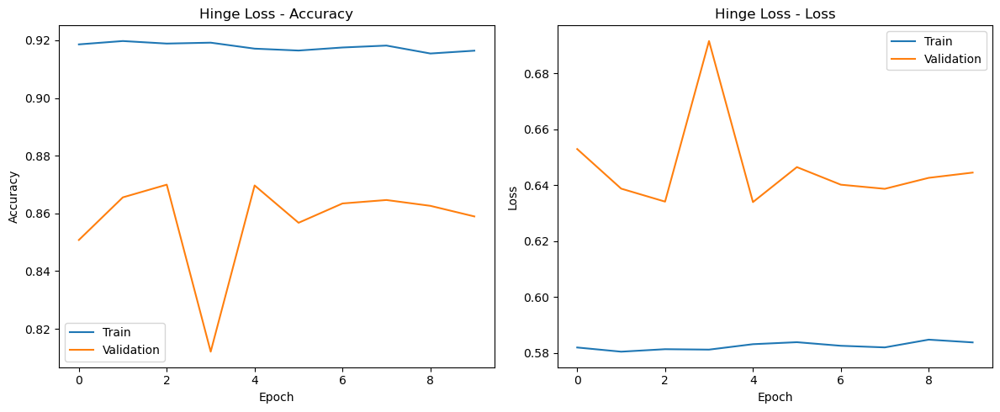

In [214]:
#learning curves
def plot_learning_curves(history, label):
    plt.figure(figsize=(12, 5))
    
    # Plot training & validation accuracy values
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title(f'{label} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(['Train', 'Validation'])
    
    # Plot training & validation loss values
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title(f'{label} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(['Train', 'Validation'])
    
    plt.tight_layout()
    plt.show()

# Example usage
plot_learning_curves(history, 'Binary Cross Entropy')
plot_learning_curves(history2, 'Focal Loss')
plot_learning_curves(history3, 'Hinge Loss')
